In [1]:
%run ./_setup.ipynb

# Setting up shapefiles

## TWDB shapes

We plot here the overall TWDB inflow estimate region, the individual subbasins, and look at the Lake Houston drainage area in particular.

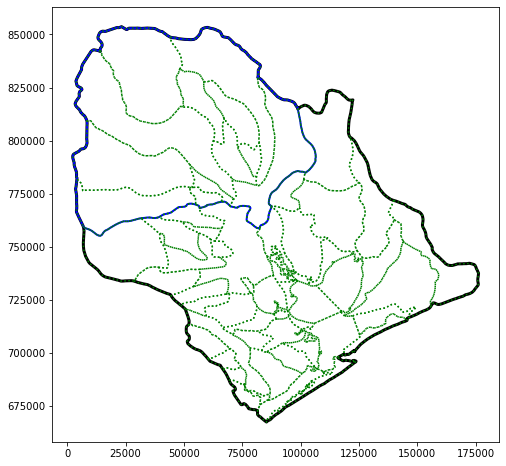

In [2]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
ax.plot(*shapes_twdbbasins_full_aea.exterior.xy, 'k', lw=3)
ax.plot(*shapes_lkhouston_full_aea.exterior.xy, 'b', lw=2)
for basin in shapes_twdbbasins:
    ax.plot(*basin.geometry.exterior.xy, ':g')

## Overall Galveston Bay watershed 

The overall watershed is not defined from TWDB inflow estimate subbasins, though part are used in order to create an improved overall watershed shape to include what seems reasonable from different sources.

In [3]:
# these are in AEA projection

# read in and put together full basin polygon
basinnamesgb = ['San Jacinto-Brazos', 'San Jacinto', 'Trinity-San Jacinto', 'Trinity']

# read in shapefile data and select the basins that we want
reader = cartopy.io.shapereader.Reader(basesf + 'Major_River_Basins_Shapefile/TWDB_MRBs_2014.shp')
basins = reader.records()
basinsgb = []
for basin in basins:
    if basin.attributes['basin_name'] in basinnamesgb:
        basinsgb.append(basin)
    

# combine into one basin. Need buffer because there are small gaps between shapes
shapes_gbay_almostfull_ll = shapely.ops.unary_union([basingb.geometry.buffer(0.0000001) for basingb in basinsgb])

# convert gbfull from pc to aea
shapes_gbay_almostfull = aea.project_geometry(shapes_gbay_almostfull_ll, pc)

print(shapes_gbay_almostfull.area/1000**2)  # area of full drainage basin with buffer
# this is missing the part of the basin that TWDB basins include

shapes_gbay_almostfull

61130.132029725195


This is the almost full watershed - missing drainage southeast of Galveston Bay that is in TWDB region. Add in southeast drainage by comparing with TWDB basins and adding in that part.

In [4]:
# full area plus twdb area since full misses a bit
shapes_gbay_full_aea = shapely.ops.unary_union([shapes_gbay_almostfull, shapes_twdbbasins_full_aea])
shapes_gbay_full_aea

This is a multipolygon but just keep the polygon with the largest area because the rest are relatively very small

In [5]:
areas = [shapes_gbay_full_aea[i].area for i in range(len(shapes_gbay_full_aea))]
imax = np.argmax(areas)

# compare the areas of the largest and the sum of the rest
print('the parts left out are the following percent of the total area')
print(((np.sum(areas) - areas[imax])/np.sum(areas))*100)

shapes_gbay_full_aea = shapes_gbay_full_aea[imax]
shapes_gbay_full_aea

the parts left out are the following percent of the total area
0.07744622938465431


## Trinity drainage basin

This represents what drains into the TWDB inflow estimate that is gauged on the Trinity river.

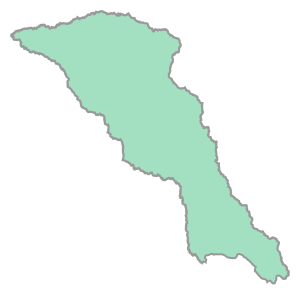

In [6]:
# Trinity is represented as full galveston drainage basin shape minus twdb basins
subtract = shapes_gbay_full_aea - shapes_twdbbasins_full_aea

# take the resulting shape with the largest area since that should be the large bit we want
# (ignore smaller bits)
areas = np.array([subtract[i].area for i in range(len(subtract))])
imax = areas.argmax()
shapes_trinity_full_aea = subtract[imax]
shapes_trinity_full_aea

## West of Galveston Bay

There is a region west of Galveston Bay that is not included in the TWDB subbasins but does appear to drain into 

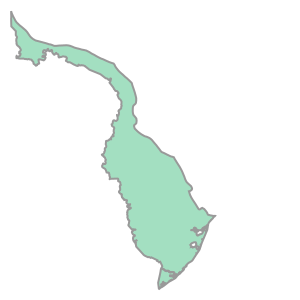

In [7]:
subtract = shapes_gbay_full_aea - shapes_trinity_full_aea - shapes_twdbbasins_full_aea 
# take the resulting shape with the largest area since that should be the large bit we want
areas = np.array([subtract[i].area for i in range(len(subtract))])
imax = areas.argmax()
shapes_west_full_aea = subtract[imax]
shapes_west_full_aea

# All Shapes

Convert from projection aea to lon/lat.

In [8]:
ll_shapes_gbay_full = pc.project_geometry(shapes_gbay_full_aea, src_crs=aea)[0].exterior.xy
ll_shapes_trinity_full = pc.project_geometry(shapes_trinity_full_aea, src_crs=aea)[0].exterior.xy
ll_shapes_twdbbasins_full = pc.project_geometry(shapes_twdbbasins_full_aea, src_crs=aea)[0].exterior.xy
ll_shapes_lkhouston_full = pc.project_geometry(shapes_lkhouston_full_aea, src_crs=aea)[0].exterior.xy
ll_shapes_ungauged_full = pc.project_geometry(shapes_ungauged_full_aea, src_crs=aea)[0].exterior.xy
ll_shapes_west_full = pc.project_geometry(shapes_west_full_aea, src_crs=aea)[0].exterior.xy

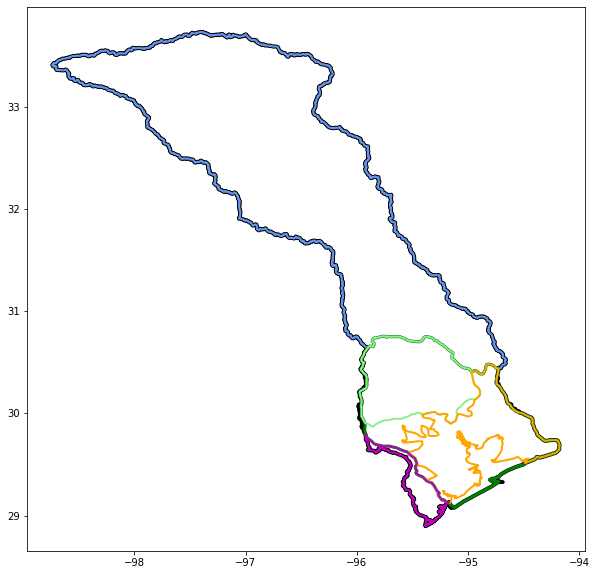

In [14]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))

# Full watershed, used to integrate radar precipitation
ax.plot(*ll_shapes_gbay_full, color='k', lw=4)


# Trinity watershed that drains into gauge in TWDB inflow estimate
ax.plot(*ll_shapes_trinity_full, color='cornflowerblue', lw=2)

# TWDB estimate region
ax.plot(*ll_shapes_twdbbasins_full, color='g', lw=3)

# TWDB subregion Lake Houston
ax.plot(*ll_shapes_lkhouston_full, color='lightgreen', lw=2)

# TWDB subregion ungauged
ax.plot(*ll_shapes_ungauged_full, color='orange', lw=2)

# Extra region west of Galveston Bay that is included in drainage basin
ax.plot(*ll_shapes_west_full, color='m', lw=2)

### Areas

Area of Lake Houston [km$^2$] (light green in above plot)

In [10]:
shapes_lkhouston_full_aea.area/1000**2

7330.631900535882

Area of Trinity drainage basin, the drainage basin represented in TWDB gauged estimate for this region (blue in above plot)

In [11]:
shapes_trinity_full_aea.area/1000**2

44479.45369115174

Area of Bay [km$^2$] (from this measure, distinct from bathymetry methods used in calculation)

In [12]:
shapes_bay_full_aea.area/1000**2

1635.0210327585235

# Save shapes

Convert exterior points of polygons to lon/lat, then save so that can then reconstitute the polygons.

Reconstitute with `shapely.geometry.Polygon(list(zip(ll[:,0], ll[:,1]))) `.

In [15]:
np.savetxt('%s/ll_shapes_gbay_full.txt' % basell, list(zip(*ll_shapes_gbay_full)), fmt='%2.20f')
np.savetxt('%s/ll_shapes_trinity_full.txt' % basell, list(zip(*ll_shapes_trinity_full)), fmt='%2.20f')
np.savetxt('%s/ll_shapes_twdbbasins_full.txt' % basell, list(zip(*ll_shapes_twdbbasins_full)), fmt='%2.20f')
np.savetxt('%s/ll_shapes_lkhouston_full.txt' % basell, list(zip(*ll_shapes_lkhouston_full)), fmt='%2.20f')
np.savetxt('%s/ll_shapes_ungauged_full.txt' % basell, list(zip(*ll_shapes_ungauged_full)), fmt='%2.20f')
np.savetxt('%s/ll_shapes_west_full.txt' % basell, list(zip(*ll_shapes_west_full)), fmt='%2.20f')